In [ ]:
import pandas as pd
import nltk
# nltk.download('wordnet')
from nltk import WordNetLemmatizer

In [ ]:
## Mount Google Drive Data (If using Google Colaboratory)
try:
    from google.colab import drive
    drive.mount('/content/drive')
except:
    print("Mounting Failed.")
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mounted at /content/drive
Mon Apr 25 16:20:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                              

In [ ]:
import pickle
# df = pd.read_csv('drive/My Drive/JHU2022SPRING/data_mining/twitter_data_v1_cleaned_with_location.csv')
df = pd.read_pickle('drive/My Drive/JHU2022SPRING/data_mining/gender_full_dataset_with_m3_March18.pkl')
# pd.

# df = df.dropna()
# df2 = pd.read_csv('twitter_data_v1_cleaned_with_location.csv')



In [ ]:
(df.text.isna()).sum() # no null text

0

For Visualizing in Embedding Projector

## Erix added, Bert clustering part

In [ ]:
####### Erix added, Bert part

!pip install transformers
import os
import requests
import time
import datetime

import zipfile
import tarfile
import shutil

import json
from typing import Any
import time
import sys

import string
import re

import numpy as np
import pandas as pd

from glob import glob
from string import Template

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report


import torch
from torch.utils.data import Dataset, DataLoader

from transformers import (
    BertTokenizer, BertTokenizerFast, BatchEncoding,
    DataCollatorForTokenClassification, BertForTokenClassification,
    Trainer, TrainingArguments
)

from transformers.modeling_outputs import TokenClassifierOutput

     |████████████████████████████████| 4.0 MB 4.1 MB/s 
     |████████████████████████████████| 895 kB 59.9 MB/s 
     |████████████████████████████████| 77 kB 8.3 MB/s 
     |████████████████████████████████| 596 kB 75.4 MB/s 
     |████████████████████████████████| 6.6 MB 57.6 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
# Erix notes: ignore the warinings about weights if appeared
from transformers import BertTokenizer, BertModel
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
tokenizer = BertTokenizerFast.from_pretrained('bert-base-cased') # SciBERT: path/scibert_scivocab_cased

model = BertModel.from_pretrained('bert-base-cased',
           output_hidden_states = True,)
model.to(device)

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/208k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/426k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/416M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(28996, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0): BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
          

In [ ]:
# Bert function definitions
def bert_text_preparation(text, tokenizer):
    marked_text = "[CLS] " + text + " [SEP]"
    tokenized_text = tokenizer.tokenize(marked_text)
    indexed_tokens = tokenizer.convert_tokens_to_ids(tokenized_text)
    segments_ids = [1]*len(indexed_tokens)

    # Convert inputs to PyTorch tensors
    tokens_tensor = torch.tensor([indexed_tokens])
    segments_tensors = torch.tensor([segments_ids])

    return tokenized_text, tokens_tensor, segments_tensors

def get_bert_embeddings(tokens_tensor, segments_tensors, model):
    # Gradient calculation id disabled
    # Model is in inference mode
    with torch.no_grad():
        outputs = model(tokens_tensor, segments_tensors)
        # Removing the first hidden state
        # The first state is the input state
        hidden_states = outputs[2][1:]

    # Getting embeddings from the final BERT layer
    token_embeddings = hidden_states[-1]
    # Collapsing the tensor into 1-dimension
    token_embeddings = torch.squeeze(token_embeddings, dim=0)
    # Converting torchtensors to lists
    list_token_embeddings = [token_embed.tolist() for token_embed in token_embeddings]

    return list_token_embeddings


def get_embedding(text, model):
    tokenized_text, tokens_tensor, segments_tensors = bert_text_preparation(text,tokenizer)
    return get_bert_embeddings(tokens_tensor, segments_tensors, model)

def show_cluster_distribution(kmeans_bert):
    cluster_count = []
    c = Counter(kmeans_bert.labels_)
    fig, ax = plt.subplots()
    for cur_class in sorted(list(c.keys())):
        cluster_count.append(c[cur_class])
    # plt.hist(list(range(len(class_dict))),class_dict)
    plt.bar(list(range(len(c))), cluster_count)
    plt.title("cluster distribution")

In [ ]:
df.text.values[1]

'@StandardbredGal Wait a minute! Testosterone in a stallion should not elicit that reaction.'

In [ ]:
# sample getting embedding
if device.type =='cuda':
    # test_embeding = get_embedding(df.text.values[1], model)
    tokenized_text, tokens_tensor, segments_tensors = bert_text_preparation(df.text.values[1],tokenizer)
    test_embeding = get_bert_embeddings(tokens_tensor.cuda(), segments_tensors.cuda(), model)
else:
    test_embeding = get_embedding(df.text.values[1], model)
print(f"Embedding size : {len(test_embeding)} words x {len(test_embeding[0])} vector_size")

test_embeding

Embedding size : 70 words x 768 vector_size


[[0.4344353675842285,
  0.2722882032394409,
  -0.1503896862268448,
  -0.3170042037963867,
  -0.1089029461145401,
  -0.238782599568367,
  0.3463992774486542,
  -0.0779193565249443,
  0.005145000759512186,
  -1.1676976680755615,
  -0.43875375390052795,
  0.2514722943305969,
  -0.23860518634319305,
  -0.1860511302947998,
  -0.7898141741752625,
  0.205095112323761,
  -0.254695862531662,
  -0.13596601784229279,
  -0.07886618375778198,
  -0.2044452726840973,
  0.3007408678531647,
  -0.21409572660923004,
  0.686479389667511,
  -0.2486235648393631,
  0.3069550693035126,
  0.5369037985801697,
  0.5885863900184631,
  0.2232442945241928,
  -0.31544169783592224,
  0.00379808503203094,
  -0.17066872119903564,
  0.4190913438796997,
  -0.343254417181015,
  -0.15148717164993286,
  -0.43756580352783203,
  0.3129543662071228,
  -0.1671297699213028,
  -0.8707115650177002,
  -0.21797704696655273,
  -0.24995356798171997,
  -0.5104727745056152,
  0.4445681869983673,
  0.22341127693653107,
  -0.1871637105941

In [ ]:
# empty cache
torch.cuda.empty_cache()

In [ ]:
all_texts = df.text.values
len(all_texts)

182314

In [ ]:
i=182
cur_texts = all_texts[i*1000:(i+1)*1000]
len(cur_texts)

314

In [ ]:
avg_all_embeddings.shape

(5858, 768)

In [ ]:
del all_embeddings

In [ ]:
len(all_embeddings[0][0])
avg_all_embeddings = np.array([np.array(em).mean(0) for em in all_embeddings])

In [ ]:
!ls

drive  sample_data


In [ ]:

# sample getting embedding
# erix note: colab pro
import pickle
all_texts = df.text.values

# getting embeddings 
from tqdm import tqdm
avg_all_embeddings = []
for i in tqdm(range(183)):
    print(f"{i} out of 182 parts")
    all_embeddings = []
    cur_texts = all_texts[i*1000:(i+1)*1000]
    for cur_text in (cur_texts):
        # get emgedding here
        if device.type =='cuda':
            tokenized_text, tokens_tensor, segments_tensors = bert_text_preparation(cur_text,tokenizer)
            all_embeddings.append(get_bert_embeddings(tokens_tensor.cuda(), segments_tensors.cuda(), model))
        else:
            all_embeddings.append(get_embedding(cur_text, model))
    avg_all_embedding = np.array([np.array(em).mean(0) for em in all_embeddings])
    avg_all_embeddings.append(avg_all_embedding)
    if (i==182 or i%40==0):
        pickle.dump(avg_all_embeddings, open(f"drive/My Drive/JHU2022SPRING/data_mining/avg_all_embeddings_{i}.pkl","wb"))
pickle.dump(avg_all_embeddings, open(f"drive/My Drive/JHU2022SPRING/data_mining/avg_all_embeddings_{i}.pkl","wb"))


  0%|          | 0/183 [00:00<?, ?it/s]

0 out of 182 parts


  1%|          | 1/183 [00:11<34:20, 11.32s/it]

1 out of 182 parts


  1%|          | 2/183 [00:22<34:25, 11.41s/it]

2 out of 182 parts


  2%|▏         | 3/183 [00:35<35:32, 11.85s/it]

3 out of 182 parts


  2%|▏         | 4/183 [00:47<35:31, 11.91s/it]

4 out of 182 parts


  3%|▎         | 5/183 [00:58<34:57, 11.78s/it]

5 out of 182 parts


  3%|▎         | 6/183 [01:10<35:02, 11.88s/it]

6 out of 182 parts


  4%|▍         | 7/183 [01:21<34:10, 11.65s/it]

7 out of 182 parts


  4%|▍         | 8/183 [01:33<33:56, 11.63s/it]

8 out of 182 parts


  5%|▍         | 9/183 [01:44<33:25, 11.53s/it]

9 out of 182 parts


  5%|▌         | 10/183 [01:56<32:54, 11.41s/it]

10 out of 182 parts


  6%|▌         | 11/183 [02:07<32:23, 11.30s/it]

11 out of 182 parts


  7%|▋         | 12/183 [02:17<31:38, 11.10s/it]

12 out of 182 parts


  7%|▋         | 13/183 [02:28<31:00, 10.94s/it]

13 out of 182 parts


  8%|▊         | 14/183 [02:38<30:23, 10.79s/it]

14 out of 182 parts


  8%|▊         | 15/183 [02:50<30:40, 10.95s/it]

15 out of 182 parts


  9%|▊         | 16/183 [03:00<30:27, 10.95s/it]

16 out of 182 parts


  9%|▉         | 17/183 [03:12<30:29, 11.02s/it]

17 out of 182 parts


 10%|▉         | 18/183 [03:23<30:27, 11.08s/it]

18 out of 182 parts


 10%|█         | 19/183 [03:35<31:09, 11.40s/it]

19 out of 182 parts


 11%|█         | 20/183 [03:47<31:24, 11.56s/it]

20 out of 182 parts


 11%|█▏        | 21/183 [03:59<31:37, 11.71s/it]

21 out of 182 parts


 12%|█▏        | 22/183 [04:11<31:58, 11.91s/it]

22 out of 182 parts


 13%|█▎        | 23/183 [04:24<32:26, 12.17s/it]

23 out of 182 parts


 13%|█▎        | 24/183 [04:37<32:31, 12.28s/it]

24 out of 182 parts


 14%|█▎        | 25/183 [04:49<32:41, 12.42s/it]

25 out of 182 parts


 14%|█▍        | 26/183 [05:02<32:55, 12.58s/it]

26 out of 182 parts


 15%|█▍        | 27/183 [05:15<32:42, 12.58s/it]

27 out of 182 parts


 15%|█▌        | 28/183 [05:27<32:17, 12.50s/it]

28 out of 182 parts


 16%|█▌        | 29/183 [05:40<32:12, 12.55s/it]

29 out of 182 parts


 16%|█▋        | 30/183 [05:52<31:51, 12.50s/it]

30 out of 182 parts


 17%|█▋        | 31/183 [06:05<31:42, 12.52s/it]

31 out of 182 parts


 17%|█▋        | 32/183 [06:18<31:53, 12.67s/it]

32 out of 182 parts


 18%|█▊        | 33/183 [06:30<31:33, 12.63s/it]

33 out of 182 parts


 19%|█▊        | 34/183 [06:43<31:07, 12.53s/it]

34 out of 182 parts


 19%|█▉        | 35/183 [06:56<31:17, 12.69s/it]

35 out of 182 parts


 20%|█▉        | 36/183 [07:08<30:52, 12.60s/it]

36 out of 182 parts


 20%|██        | 37/183 [07:20<30:21, 12.48s/it]

37 out of 182 parts


 21%|██        | 38/183 [07:33<30:31, 12.63s/it]

38 out of 182 parts


 21%|██▏       | 39/183 [07:46<30:06, 12.55s/it]

39 out of 182 parts


 22%|██▏       | 40/183 [07:58<29:46, 12.49s/it]

40 out of 182 parts


 22%|██▏       | 41/183 [08:12<30:12, 12.77s/it]

41 out of 182 parts


 23%|██▎       | 42/183 [08:24<29:48, 12.68s/it]

42 out of 182 parts


 23%|██▎       | 43/183 [08:36<29:25, 12.61s/it]

43 out of 182 parts


 24%|██▍       | 44/183 [08:49<29:02, 12.53s/it]

44 out of 182 parts


 25%|██▍       | 45/183 [09:01<28:55, 12.57s/it]

45 out of 182 parts


 25%|██▌       | 46/183 [09:14<28:34, 12.51s/it]

46 out of 182 parts


 26%|██▌       | 47/183 [09:26<28:09, 12.42s/it]

47 out of 182 parts


 26%|██▌       | 48/183 [09:39<28:18, 12.58s/it]

48 out of 182 parts


 27%|██▋       | 49/183 [09:51<27:57, 12.52s/it]

49 out of 182 parts


 27%|██▋       | 50/183 [10:04<27:31, 12.42s/it]

50 out of 182 parts


 28%|██▊       | 51/183 [10:16<27:35, 12.54s/it]

51 out of 182 parts


 28%|██▊       | 52/183 [10:29<27:18, 12.50s/it]

52 out of 182 parts


 29%|██▉       | 53/183 [10:41<26:57, 12.44s/it]

53 out of 182 parts


 30%|██▉       | 54/183 [10:54<27:15, 12.68s/it]

54 out of 182 parts


 30%|███       | 55/183 [11:07<26:57, 12.64s/it]

55 out of 182 parts


 31%|███       | 56/183 [11:19<26:31, 12.53s/it]

56 out of 182 parts


 31%|███       | 57/183 [11:32<26:13, 12.49s/it]

57 out of 182 parts


 32%|███▏      | 58/183 [11:44<26:15, 12.60s/it]

58 out of 182 parts


 32%|███▏      | 59/183 [11:57<25:52, 12.52s/it]

59 out of 182 parts


 33%|███▎      | 60/183 [12:09<25:29, 12.43s/it]

60 out of 182 parts


 33%|███▎      | 61/183 [12:22<25:28, 12.53s/it]

61 out of 182 parts


 34%|███▍      | 62/183 [12:34<25:02, 12.42s/it]

62 out of 182 parts


 34%|███▍      | 63/183 [12:47<25:03, 12.53s/it]

63 out of 182 parts


 35%|███▍      | 64/183 [13:00<25:12, 12.71s/it]

64 out of 182 parts


 36%|███▌      | 65/183 [13:12<24:52, 12.64s/it]

65 out of 182 parts


 36%|███▌      | 66/183 [13:25<24:36, 12.62s/it]

66 out of 182 parts


 37%|███▋      | 67/183 [13:38<24:47, 12.82s/it]

67 out of 182 parts


 37%|███▋      | 68/183 [13:51<24:23, 12.72s/it]

68 out of 182 parts


 38%|███▊      | 69/183 [14:03<24:00, 12.64s/it]

69 out of 182 parts


 38%|███▊      | 70/183 [14:16<24:08, 12.82s/it]

70 out of 182 parts


 39%|███▉      | 71/183 [14:29<23:42, 12.70s/it]

71 out of 182 parts


 39%|███▉      | 72/183 [14:41<23:20, 12.62s/it]

72 out of 182 parts


 40%|███▉      | 73/183 [14:54<23:22, 12.75s/it]

73 out of 182 parts


 40%|████      | 74/183 [15:07<23:02, 12.68s/it]

74 out of 182 parts


 41%|████      | 75/183 [15:19<22:39, 12.59s/it]

75 out of 182 parts


 42%|████▏     | 76/183 [15:32<22:23, 12.56s/it]

76 out of 182 parts


 42%|████▏     | 77/183 [15:44<22:16, 12.60s/it]

77 out of 182 parts


 43%|████▎     | 78/183 [15:57<21:59, 12.57s/it]

78 out of 182 parts


 43%|████▎     | 79/183 [16:10<22:01, 12.71s/it]

79 out of 182 parts


 44%|████▎     | 80/183 [16:22<21:43, 12.66s/it]

80 out of 182 parts


 44%|████▍     | 81/183 [16:36<21:53, 12.88s/it]

81 out of 182 parts


 45%|████▍     | 82/183 [16:50<22:06, 13.14s/it]

82 out of 182 parts


 45%|████▌     | 83/183 [17:02<21:38, 12.99s/it]

83 out of 182 parts


 46%|████▌     | 84/183 [17:15<21:10, 12.83s/it]

84 out of 182 parts


 46%|████▋     | 85/183 [17:27<20:40, 12.66s/it]

85 out of 182 parts


 47%|████▋     | 86/183 [17:39<20:22, 12.60s/it]

86 out of 182 parts


 48%|████▊     | 87/183 [17:52<20:12, 12.63s/it]

87 out of 182 parts


 48%|████▊     | 88/183 [18:04<19:52, 12.55s/it]

88 out of 182 parts


 49%|████▊     | 89/183 [18:18<20:03, 12.80s/it]

89 out of 182 parts


 49%|████▉     | 90/183 [18:30<19:32, 12.61s/it]

90 out of 182 parts


 50%|████▉     | 91/183 [18:42<19:09, 12.49s/it]

91 out of 182 parts


 50%|█████     | 92/183 [18:55<19:02, 12.56s/it]

92 out of 182 parts


 51%|█████     | 93/183 [19:07<18:50, 12.56s/it]

93 out of 182 parts


 51%|█████▏    | 94/183 [19:20<18:33, 12.51s/it]

94 out of 182 parts


 52%|█████▏    | 95/183 [19:33<18:44, 12.78s/it]

95 out of 182 parts


 52%|█████▏    | 96/183 [19:46<18:19, 12.64s/it]

96 out of 182 parts


 53%|█████▎    | 97/183 [19:58<17:52, 12.47s/it]

97 out of 182 parts


 54%|█████▎    | 98/183 [20:11<17:53, 12.63s/it]

98 out of 182 parts


 54%|█████▍    | 99/183 [20:23<17:32, 12.52s/it]

99 out of 182 parts


 55%|█████▍    | 100/183 [20:35<17:17, 12.50s/it]

100 out of 182 parts


 55%|█████▌    | 101/183 [20:48<17:01, 12.46s/it]

101 out of 182 parts


 56%|█████▌    | 102/183 [21:01<17:01, 12.61s/it]

102 out of 182 parts


 56%|█████▋    | 103/183 [21:14<16:56, 12.71s/it]

103 out of 182 parts


 57%|█████▋    | 104/183 [21:26<16:42, 12.69s/it]

104 out of 182 parts


 57%|█████▋    | 105/183 [21:39<16:34, 12.74s/it]

105 out of 182 parts


 58%|█████▊    | 106/183 [21:52<16:28, 12.84s/it]

106 out of 182 parts


 58%|█████▊    | 107/183 [22:05<16:21, 12.91s/it]

107 out of 182 parts


 59%|█████▉    | 108/183 [22:18<16:00, 12.81s/it]

108 out of 182 parts


 60%|█████▉    | 109/183 [22:30<15:38, 12.68s/it]

109 out of 182 parts


 60%|██████    | 110/183 [22:43<15:20, 12.61s/it]

110 out of 182 parts


 61%|██████    | 111/183 [22:56<15:13, 12.69s/it]

111 out of 182 parts


 61%|██████    | 112/183 [23:08<14:54, 12.60s/it]

112 out of 182 parts


 62%|██████▏   | 113/183 [23:20<14:37, 12.54s/it]

113 out of 182 parts


 62%|██████▏   | 114/183 [23:33<14:33, 12.66s/it]

114 out of 182 parts


 63%|██████▎   | 115/183 [23:46<14:13, 12.55s/it]

115 out of 182 parts


 63%|██████▎   | 116/183 [23:58<14:01, 12.55s/it]

116 out of 182 parts


 64%|██████▍   | 117/183 [24:11<14:02, 12.77s/it]

117 out of 182 parts


 64%|██████▍   | 118/183 [24:24<13:45, 12.70s/it]

118 out of 182 parts


 65%|██████▌   | 119/183 [24:36<13:26, 12.59s/it]

119 out of 182 parts


 66%|██████▌   | 120/183 [24:49<13:18, 12.67s/it]

120 out of 182 parts


 66%|██████▌   | 121/183 [25:04<13:39, 13.22s/it]

121 out of 182 parts


 67%|██████▋   | 122/183 [25:18<13:47, 13.56s/it]

122 out of 182 parts


 67%|██████▋   | 123/183 [25:31<13:20, 13.35s/it]

123 out of 182 parts


 68%|██████▊   | 124/183 [25:43<12:47, 13.01s/it]

124 out of 182 parts


 68%|██████▊   | 125/183 [25:55<12:23, 12.82s/it]

125 out of 182 parts


 69%|██████▉   | 126/183 [26:08<12:09, 12.79s/it]

126 out of 182 parts


 69%|██████▉   | 127/183 [26:21<11:52, 12.72s/it]

127 out of 182 parts


 70%|██████▉   | 128/183 [26:33<11:37, 12.68s/it]

128 out of 182 parts


 70%|███████   | 129/183 [26:47<11:34, 12.86s/it]

129 out of 182 parts


 71%|███████   | 130/183 [26:59<11:16, 12.77s/it]

130 out of 182 parts


 72%|███████▏  | 131/183 [27:12<11:00, 12.71s/it]

131 out of 182 parts


 72%|███████▏  | 132/183 [27:25<10:51, 12.78s/it]

132 out of 182 parts


 73%|███████▎  | 133/183 [27:37<10:35, 12.71s/it]

133 out of 182 parts


 73%|███████▎  | 134/183 [27:50<10:21, 12.69s/it]

134 out of 182 parts


 74%|███████▍  | 135/183 [28:03<10:12, 12.76s/it]

135 out of 182 parts


 74%|███████▍  | 136/183 [28:15<09:53, 12.62s/it]

136 out of 182 parts


 75%|███████▍  | 137/183 [28:27<09:36, 12.54s/it]

137 out of 182 parts


 75%|███████▌  | 138/183 [28:40<09:30, 12.68s/it]

138 out of 182 parts


 76%|███████▌  | 139/183 [28:53<09:15, 12.64s/it]

139 out of 182 parts


 77%|███████▋  | 140/183 [29:06<09:09, 12.79s/it]

140 out of 182 parts


 77%|███████▋  | 141/183 [29:19<09:03, 12.94s/it]

141 out of 182 parts


 78%|███████▊  | 142/183 [29:32<08:50, 12.93s/it]

142 out of 182 parts


 78%|███████▊  | 143/183 [29:45<08:29, 12.73s/it]

143 out of 182 parts


 79%|███████▊  | 144/183 [29:57<08:13, 12.66s/it]

144 out of 182 parts


 79%|███████▉  | 145/183 [30:10<08:06, 12.80s/it]

145 out of 182 parts


 80%|███████▉  | 146/183 [30:23<07:49, 12.69s/it]

146 out of 182 parts


 80%|████████  | 147/183 [30:35<07:32, 12.58s/it]

147 out of 182 parts


 81%|████████  | 148/183 [30:48<07:24, 12.69s/it]

148 out of 182 parts


 81%|████████▏ | 149/183 [31:00<07:07, 12.58s/it]

149 out of 182 parts


 82%|████████▏ | 150/183 [31:13<06:54, 12.56s/it]

150 out of 182 parts


 83%|████████▎ | 151/183 [31:26<06:46, 12.69s/it]

151 out of 182 parts


 83%|████████▎ | 152/183 [31:38<06:31, 12.63s/it]

152 out of 182 parts


 84%|████████▎ | 153/183 [31:51<06:18, 12.61s/it]

153 out of 182 parts


 84%|████████▍ | 154/183 [32:04<06:07, 12.67s/it]

154 out of 182 parts


 85%|████████▍ | 155/183 [32:16<05:53, 12.62s/it]

155 out of 182 parts


 85%|████████▌ | 156/183 [32:29<05:43, 12.72s/it]

156 out of 182 parts


 86%|████████▌ | 157/183 [32:42<05:28, 12.64s/it]

157 out of 182 parts


 86%|████████▋ | 158/183 [32:54<05:16, 12.68s/it]

158 out of 182 parts


 87%|████████▋ | 159/183 [33:07<05:03, 12.64s/it]

159 out of 182 parts


 87%|████████▋ | 160/183 [33:20<04:54, 12.81s/it]

160 out of 182 parts


 88%|████████▊ | 161/183 [33:36<05:01, 13.70s/it]

161 out of 182 parts


 89%|████████▊ | 162/183 [33:50<04:50, 13.82s/it]

162 out of 182 parts


 89%|████████▉ | 163/183 [34:03<04:33, 13.68s/it]

163 out of 182 parts


 90%|████████▉ | 164/183 [34:16<04:13, 13.32s/it]

164 out of 182 parts


 90%|█████████ | 165/183 [34:29<03:59, 13.29s/it]

165 out of 182 parts


 91%|█████████ | 166/183 [34:42<03:42, 13.06s/it]

166 out of 182 parts


 91%|█████████▏| 167/183 [34:53<03:23, 12.69s/it]

167 out of 182 parts


 92%|█████████▏| 168/183 [35:05<03:07, 12.50s/it]

168 out of 182 parts


 92%|█████████▏| 169/183 [35:18<02:56, 12.58s/it]

169 out of 182 parts


 93%|█████████▎| 170/183 [35:31<02:43, 12.55s/it]

170 out of 182 parts


 93%|█████████▎| 171/183 [35:43<02:30, 12.56s/it]

171 out of 182 parts


 94%|█████████▍| 172/183 [35:56<02:19, 12.65s/it]

172 out of 182 parts


 95%|█████████▍| 173/183 [36:08<02:05, 12.55s/it]

173 out of 182 parts


 95%|█████████▌| 174/183 [36:21<01:52, 12.48s/it]

174 out of 182 parts


 96%|█████████▌| 175/183 [36:34<01:40, 12.61s/it]

175 out of 182 parts


 96%|█████████▌| 176/183 [36:46<01:27, 12.48s/it]

176 out of 182 parts


 97%|█████████▋| 177/183 [36:58<01:14, 12.40s/it]

177 out of 182 parts


 97%|█████████▋| 178/183 [37:11<01:03, 12.65s/it]

178 out of 182 parts


 98%|█████████▊| 179/183 [37:24<00:50, 12.53s/it]

179 out of 182 parts


 98%|█████████▊| 180/183 [37:36<00:37, 12.44s/it]

180 out of 182 parts


 99%|█████████▉| 181/183 [37:48<00:24, 12.46s/it]

181 out of 182 parts


 99%|█████████▉| 182/183 [38:00<00:12, 12.38s/it]

182 out of 182 parts


100%|██████████| 183/183 [38:08<00:00, 12.51s/it]


In [ ]:
# pickle.dump(avg_all_embeddings, open(f"drive/My Drive/JHU2022SPRING/data_mining/avg_all_embeddings_{i}.pkl","wb"))


In [ ]:
avg_all_embeddings2 = np.vstack(avg_all_embeddings)
df['Bert_embedding'] = avg_all_embeddings2.tolist()
df['Bert_embedding'] = df['Bert_embedding'].apply(np.array)
del avg_all_embeddings2

In [ ]:
tt = df.head(2).Bert_embedding.values

In [ ]:
import pickle
# pickle.dump(df, open(f"drive/My Drive/JHU2022SPRING/data_mining/gender_full_dataset_with_m3_bert_Apr20.pkl","wb"))
df = pickle.load(open(f"drive/My Drive/JHU2022SPRING/data_mining/gender_full_dataset_with_m3_bert_Apr20.pkl","rb"))

In [ ]:
df.shape

(182314, 36)

In [ ]:
import pickle

# pickle.dump(avg_all_embeddings, open('drive/My Drive/JHU2022SPRING/data_mining/bert_embedding_for_na.pkl', 'wb'))
# avg_all_embeddings = pickle.load(open(f"drive/My Drive/JHU2022SPRING/data_mining/bert_embedding_for_na.pkl","rb"))

FileNotFoundError: ignored

In [ ]:
avg_all_embeddings = df.Bert_embedding.values.tolist()

In [ ]:
# avg_all_embeddings[0]

In [ ]:
from sklearn.cluster import KMeans
n_clusters = 10 # change n-clusters here
kmeans_bert = KMeans(n_clusters = n_clusters).fit(avg_all_embeddings)

df['clusters_bert'] = kmeans_bert.labels_

show_cluster_distribution(kmeans_bert)

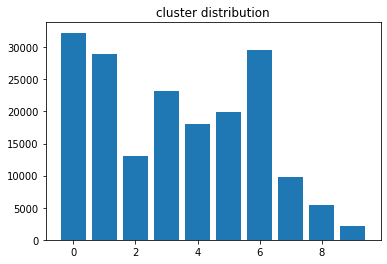

In [ ]:
show_cluster_distribution(kmeans_bert)

In [ ]:
import pickle
# added bert cluster label
# pickle.dump(df, open(f"drive/My Drive/JHU2022SPRING/data_mining/gender_full_dataset_with_m3_bert_Apr22.pkl","wb"))
df = pickle.load(open(f"drive/My Drive/JHU2022SPRING/data_mining/gender_full_dataset_with_m3_bert_Apr22.pkl","rb"))

In [ ]:
# word cloud for each cluster
# author: Alakarthika
import nltk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools as it
import os
from nltk.corpus import stopwords
from nltk.tokenize import TweetTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import *
stemmer = PorterStemmer()
from wordcloud import WordCloud
import re
from collections import Counter
from string import punctuation
import json
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

In [ ]:
def clean_data(tweet):
    # Remove HTML special entities (e.g. &amp;)
    tweet = re.sub(r'\&\w*;', '', tweet)
    #Convert @username to AT_USER
    tweet = re.sub('@[^\s]+','',tweet)
    # Remove tickers
    tweet = re.sub(r'\$\w*', '', tweet)
    # To lowercase
    tweet = tweet.lower()
    # Remove hyperlinks
    tweet = re.sub(r'https?:\/\/.*\/\w*', '', tweet)
    # Remove hashtags
    tweet = re.sub(r'#\w*', '', tweet)
    # Remove Punctuation and split 's, 't, 've with a space for filter
    tweet = re.sub(r'[' + punctuation.replace('@', '') + ']+', ' ', tweet)
    # Remove words with 2 or fewer letters
    tweet = re.sub(r'\b\w{1,2}\b', '', tweet)
    tweet = re.sub("[^a-z0-9]"," ", tweet)
    # Remove whitespace (including new line characters)
    tweet = re.sub(r'\s\s+', ' ', tweet)
    # Remove single space remaining at the front of the tweet.
    tweet = tweet.lstrip(' ') 
    # Remove characters beyond Basic Multilingual Plane (BMP) of Unicode:
    tweet = ''.join(c for c in tweet if c <= '\uFFFF') 
    return tweet
# ______________________________________________________________

# clean dataframe's text column



In [ ]:
df['cleaned text'] = df['text'].apply(clean_data)

In [ ]:
clean_tweets_clusters = []
cluster_word_counters = []

for cluster in range(df.Bert_cluster_kmeans.nunique()):
    clean_tweets_clusters.append(df[df.Bert_cluster_kmeans==cluster]['cleaned text'].values.tolist())
    
for tweets_texts in clean_tweets_clusters:
    all_words = []
    for line in tweets_texts:
        words = line.split()
        for word in words:
            all_words.append(word.lower())
    cluster_word_counters.append(Counter(all_words))
    

In [ ]:
c=clean_tweets_cluster_counter[-1]

In [ ]:
del clean_tweets_cluster

In [ ]:
# get the frequency of the most common n words
def most_common_freq(counter, n=10):
    return [[word, count/sum(c.values())] for (word,count) in c.most_common(n)]

for idx, c in enumerate(cluster_word_counters):
    print(f"\n\n{idx}-th cluster:")
    top_n_freq = most_common_freq(c, n=10)
    print(top_n_freq)



0-th cluster:
[['the', 0.04255951955758568], ['and', 0.030561446937945887], ['you', 0.0200205985529062], ['that', 0.01560736508662172], ['for', 0.01273837370138852], ['are', 0.010033027818436614], ['women', 0.009334287499172032], ['not', 0.009032971971162027], ['this', 0.007954989694229678], ['with', 0.0075666563197685065]]


1-th cluster:
[['the', 0.04490826806728765], ['and', 0.036043278404056765], ['that', 0.020152717032324], ['you', 0.015183469992733012], ['women', 0.0127999470600562], ['for', 0.012788917905097797], ['are', 0.011592867322942235], ['not', 0.009694627208435098], ['they', 0.008107654356087297], ['with', 0.007728986702515505]]


2-th cluster:
[['the', 0.042957912566197125], ['and', 0.02703201046289745], ['for', 0.01633755708496816], ['you', 0.013751849231362964], ['women', 0.012298192577346111], ['this', 0.010278510323535087], ['that', 0.008653330760489698], ['with', 0.008344589524238331], ['are', 0.007525567633627066], ['all', 0.005921828434210244]]


3-th cluster:


In [ ]:
# tokenisation
from nltk.corpus import stopwords
nltk.download('stopwords')
# show stop words examples
stop_words = stopwords.words('english') # Show some stop words
' , '.join(stop_words)[:200], len(stop_words)
print(type(stop_words))
print(stop_words)
import string
def text_process(raw_text):
    """
    Takes in a string of text, then performs the following:
    1. Remove all punctuation
    2. Remove all stopwords
    3. Returns a list of the cleaned text
    """
    # Check characters to see if they are in punctuation
    nopunc = [char for char in list(raw_text) if char not in string.punctuation]

    # Join the characters again to form the string.
    nopunc = ''.join(nopunc)
    
    # Now just remove any stopwords except for those in first person
    return [word for word in nopunc.lower().split() if word.lower() not in stopwords.words('english')]

# -------------------------------------------

# tokenize message column and create a column for tokens
df['tokens'] = df['cleaned text'].apply(text_process) # tokenize style 1
df['tokens'].head()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
<class 'list'>
['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'an

0    [even, sit, silver, lake, coffee, shop, listen...
1    [still, lobbying, barbie, nutcracker, next, de...
2    [look, gop, legislators, asked, question, ille...
3                   [thank, god, masculine, man, love]
4    [wait, minute, testosterone, stallion, elicit,...
Name: tokens, dtype: object

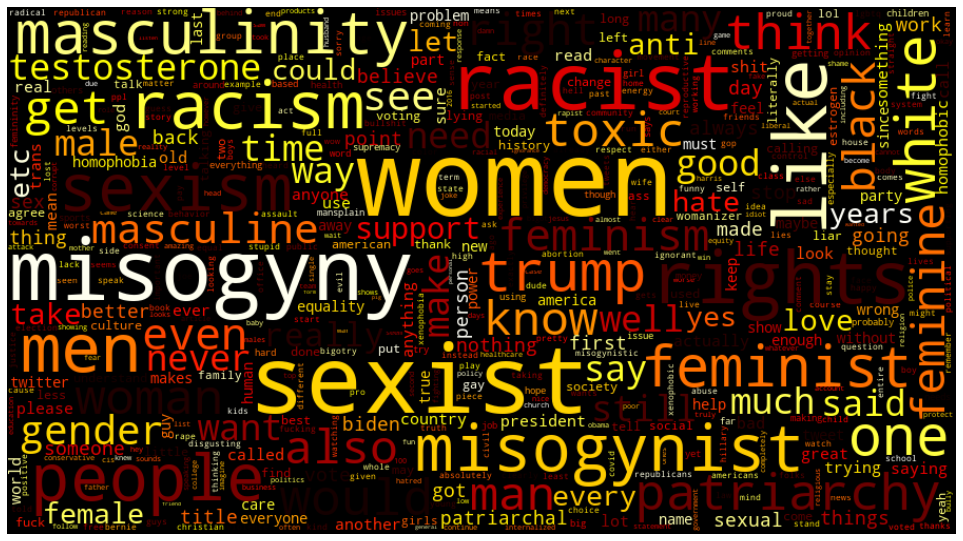

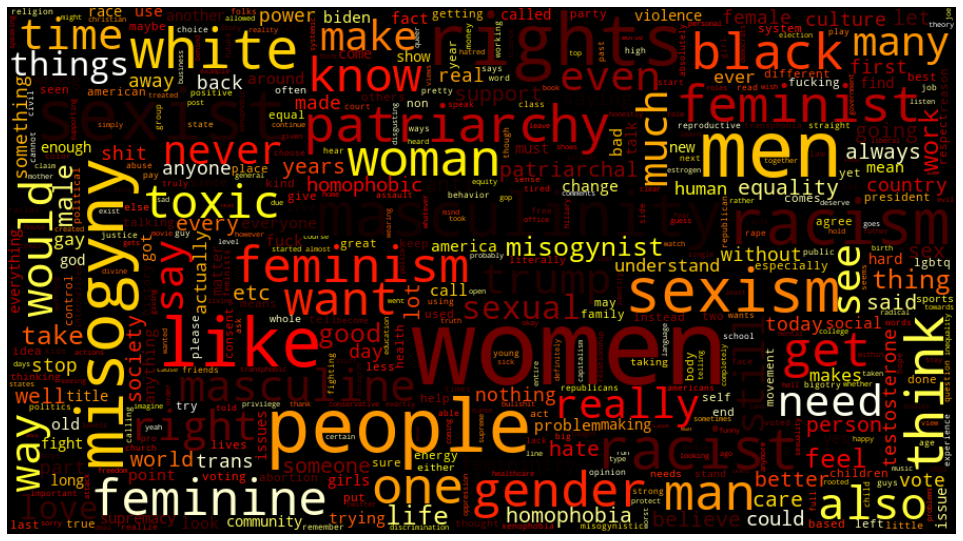

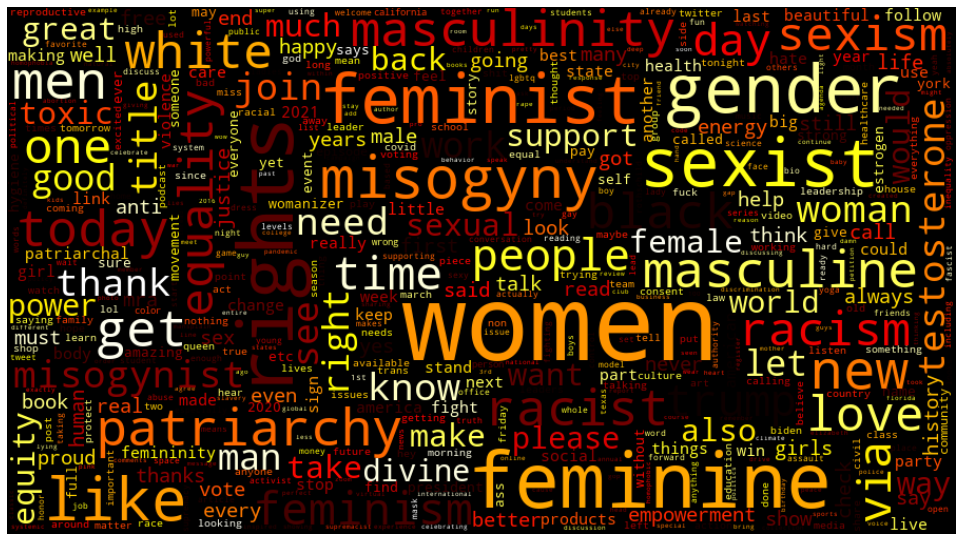

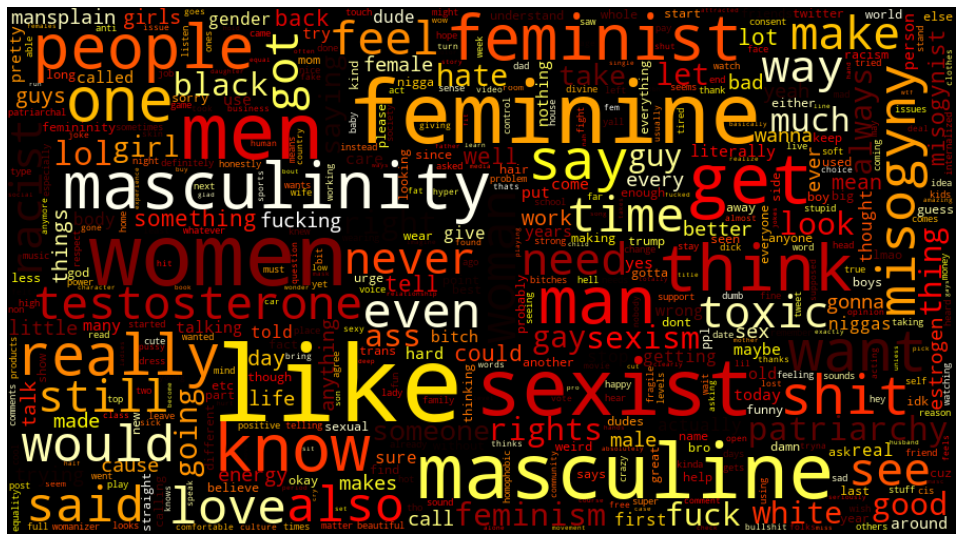

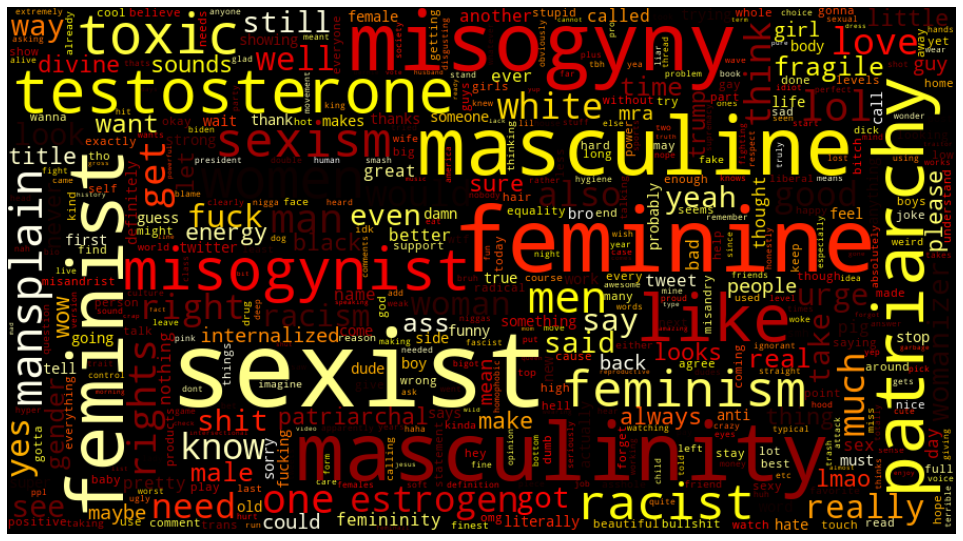

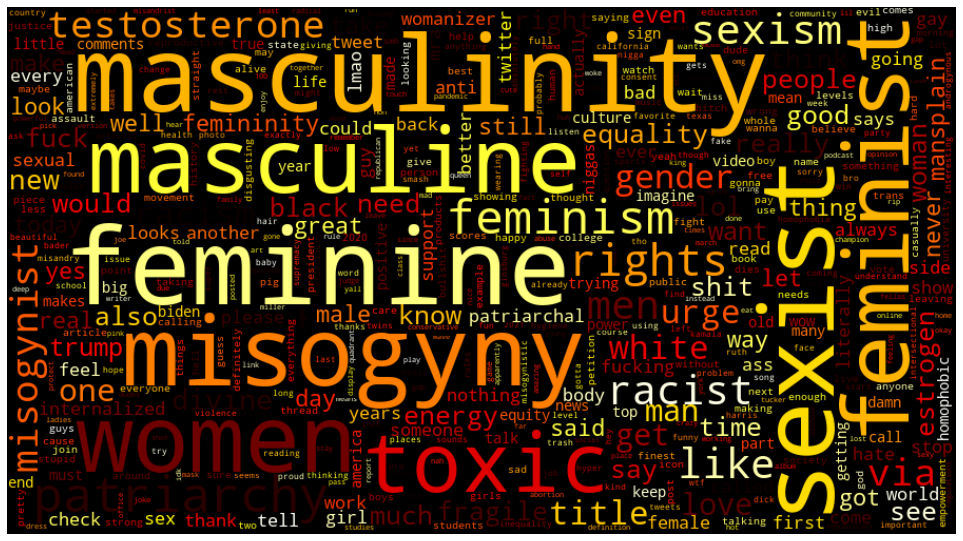

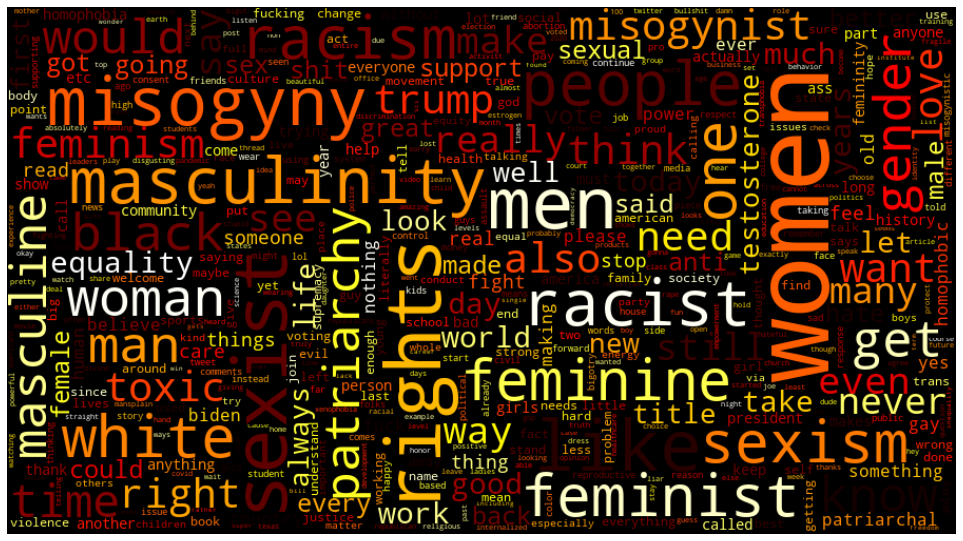

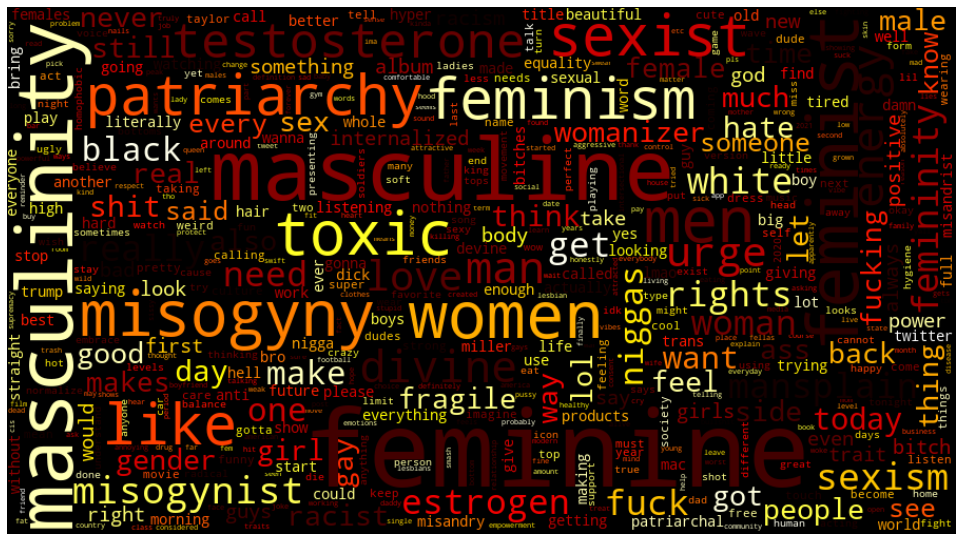

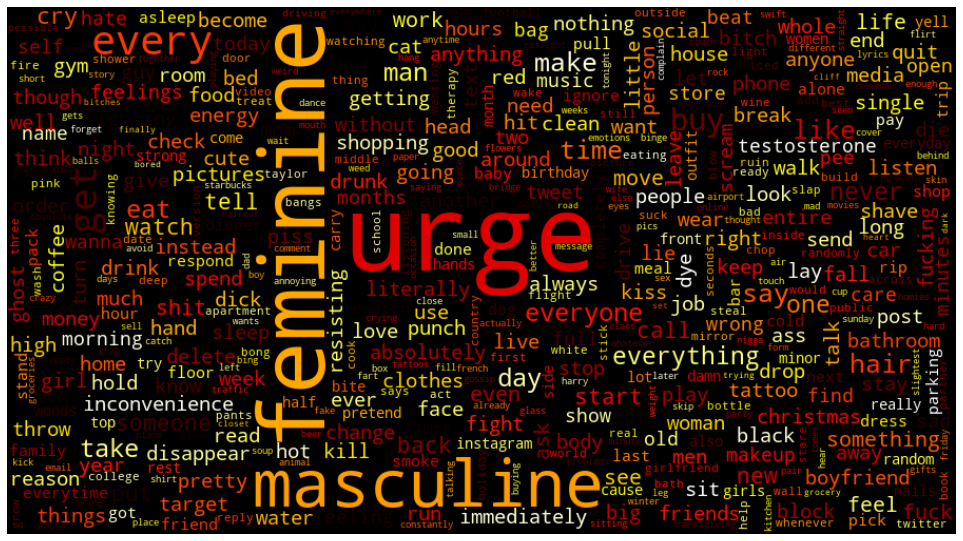

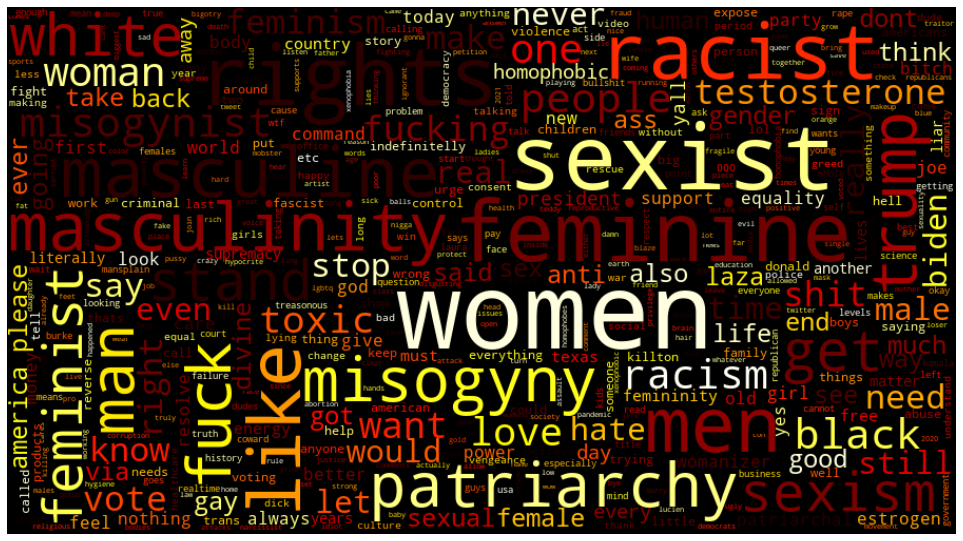

In [ ]:
#word_cloud for each cluster

cluster_word_cloud = []
for cluster in range(df.Bert_cluster_kmeans.nunique()):
    all_words = []
    for line in df[df.Bert_cluster_kmeans==cluster]['tokens']: # try 'tokens'
         all_words.extend(line)
    wordfreq = Counter(all_words)
    wordcloud = WordCloud(width=900,
                      height=500,
                      max_words=500,
                      max_font_size=100,
                      relative_scaling=0.5,
                      colormap='hot',
                      normalize_plurals=True).generate_from_frequencies(wordfreq)

    cluster_word_cloud.append(wordcloud)
    plt.figure(figsize=(17,14))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


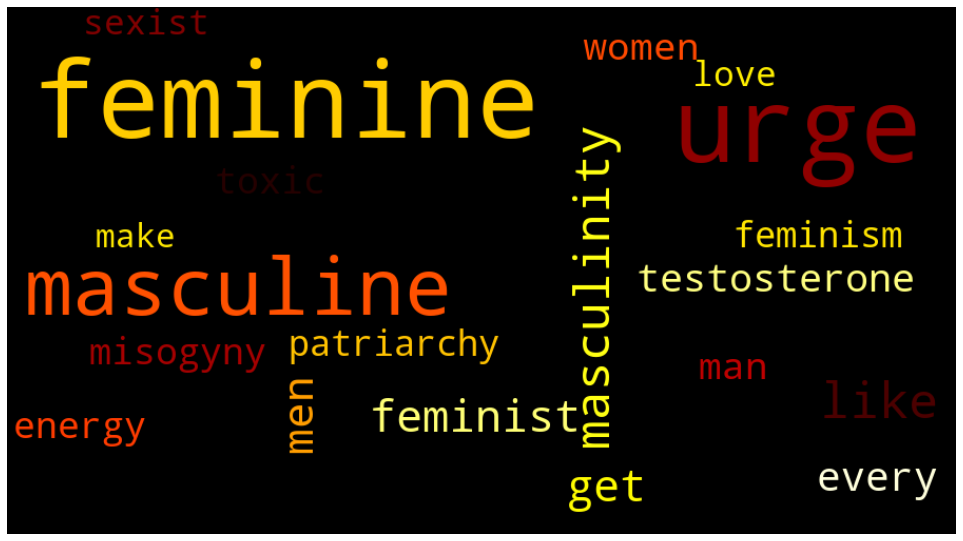

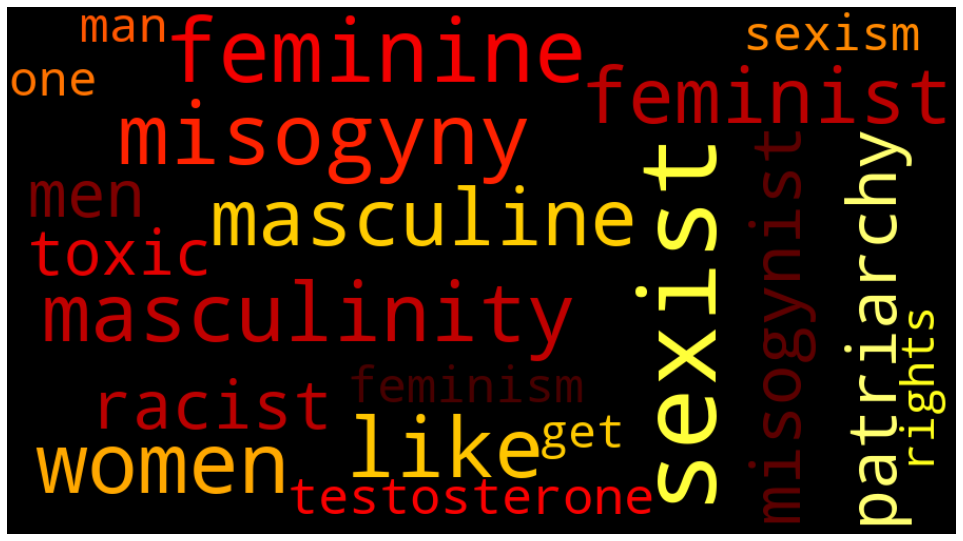

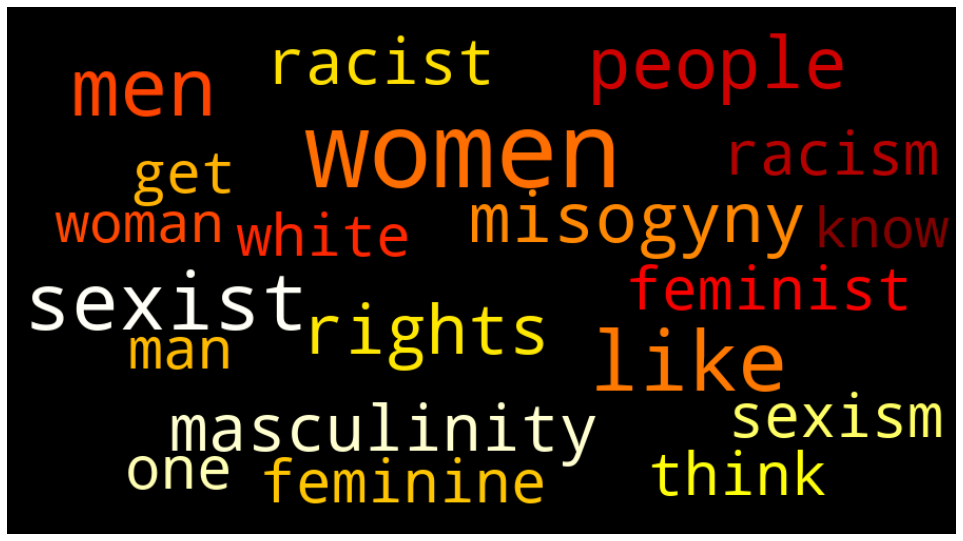

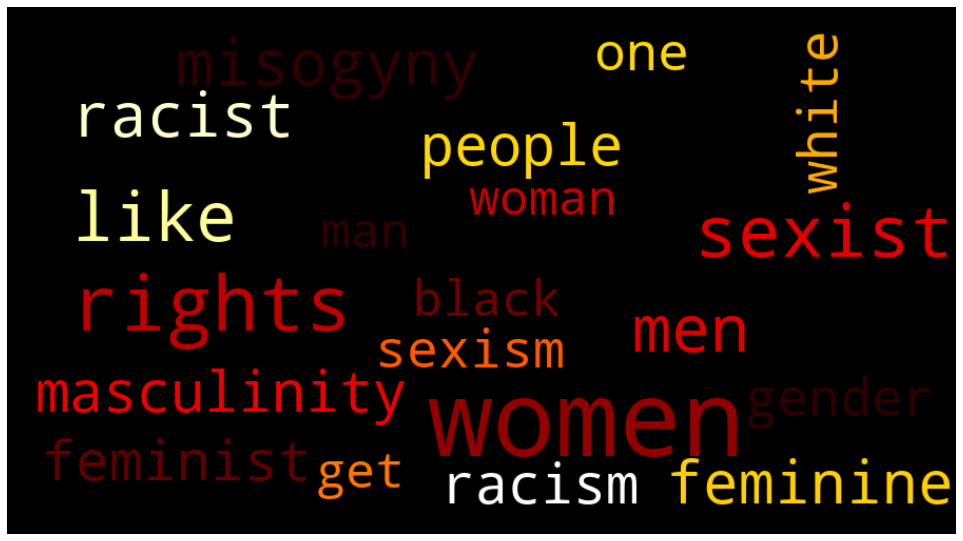

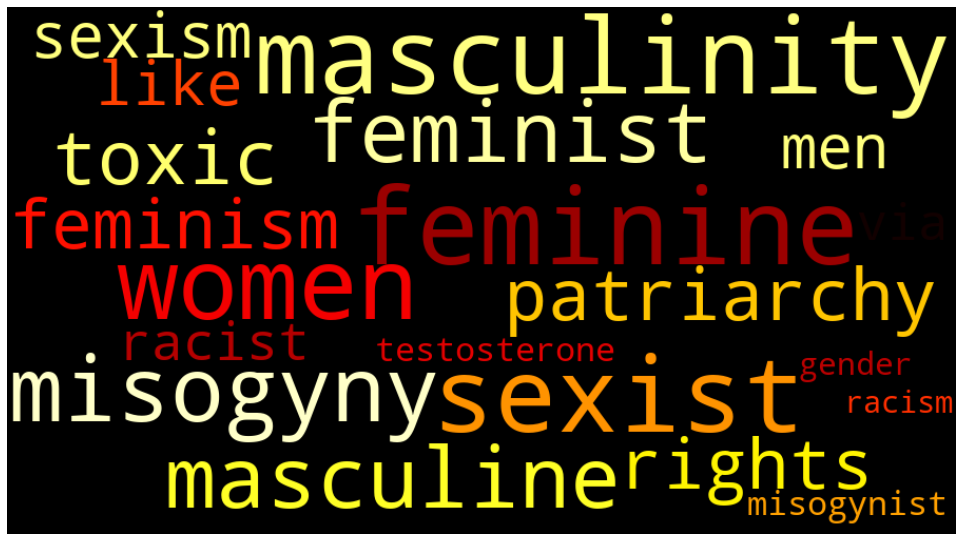

In [ ]:

df['Bert_cluster_kmeans_trial'] = kmeans_bert.labels_
cluster_word_cloud = []
for cluster in range(df.Bert_cluster_kmeans_trial.nunique()):
    all_words = []
    for line in df[df.Bert_cluster_kmeans_trial==cluster]['tokens']: # try 'tokens'
         all_words.extend(line)
    wordfreq = Counter(all_words)
    wordcloud = WordCloud(width=900,
                      height=500,
                      max_words=20,
                      max_font_size=100,
                      relative_scaling=0.5,
                      colormap='hot',
                      normalize_plurals=True).generate_from_frequencies(wordfreq)

    cluster_word_cloud.append(wordcloud)
    plt.figure(figsize=(17,14))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


100%|██████████| 10/10 [12:03<00:00, 72.31s/it] 


<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

<Figure size 1152x576 with 0 Axes>

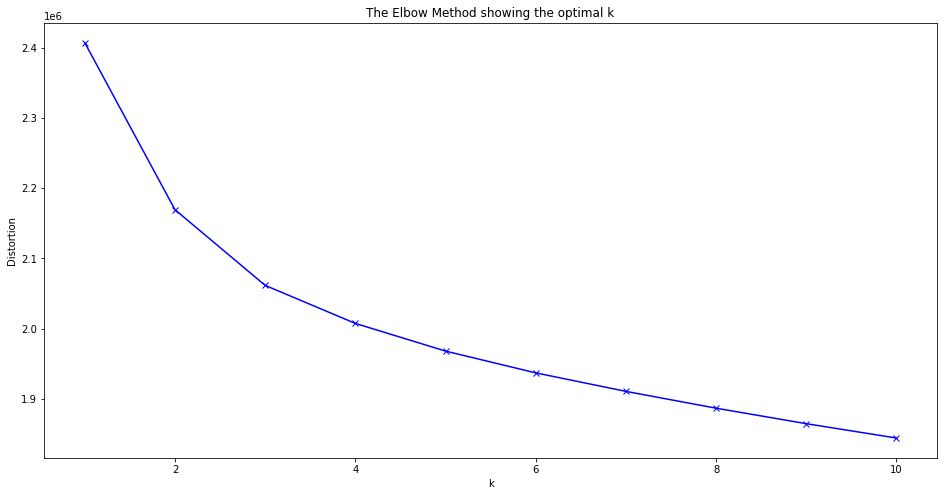

In [ ]:
distortions = []
kmeans_res = []
K = range(1,11)
from tqdm import tqdm
for k in tqdm(K):
    # kmeans_bert = KMeans(n_clusters = n_clusters).fit(avg_all_embeddings)
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(avg_all_embeddings) 
    distortions.append(kmeanModel.inertia_)
    kmeans_res.append(kmeanModel)
    plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

removing very common words among all clusters
num clusters: 3
['women', 'like', 'sexist', 'men', 'misogyny', 'rights', 'racist', 'masculinity', 'feminine', 'sexism', 'one', 'think', 'feminist', 'get', 'man', 'white', 'woman', 'know', 'masculine', 'patriarchy', 'would', 'also', 'toxic', 'feminism', 'misogynist', 'need']
num clusters: 4
['feminine', 'masculine', 'like', 'masculinity', 'feminist', 'men', 'get', 'women', 'man', 'misogyny', 'toxic', 'feminism', 'patriarchy', 'sexist', 'one', 'need', 'woman']


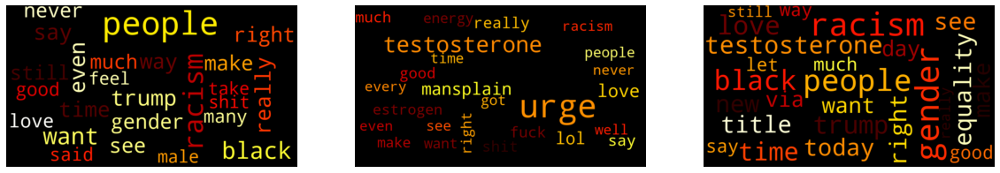

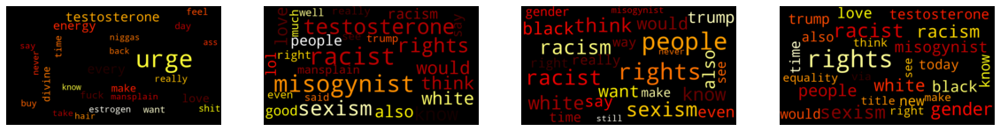

In [ ]:
print("removing very common words among all clusters")
for cur_kmeans_result in kmeans_res[2:4]: # from 1 to 10, inclusive
    print(f"num clusters: {len(set(cur_kmeans_result.labels_))}")
    df['Bert_cluster_kmeans_trial'] = cur_kmeans_result.labels_
    cluster_word_cloud = []
    word_freqs = []
    most_freq_30_words = []
    for cluster in range(df.Bert_cluster_kmeans_trial.nunique()):
        all_words = []
        for line in df[df.Bert_cluster_kmeans_trial==cluster]['tokens']: # try 'tokens'
            all_words.extend(line)
        wordfreq = Counter(all_words)
        word_freqs.append(wordfreq)
        most_freq_30_words.extend([pair[0] for pair in wordfreq.most_common(40)])
    
    # remove words that are very common in all 4 clusters
    most_freq_counter = Counter(most_freq_30_words)
    remove_words = [word for word in most_freq_counter if most_freq_counter[word]>=len(set(cur_kmeans_result.labels_))]
    print(remove_words)
    fig, axes = plt.subplots(1, len(set(cur_kmeans_result.labels_)), figsize=(20,4))
    for i, word_freq in enumerate(word_freqs):
        for word in remove_words:
            del word_freq[word]
        wordcloud = WordCloud(width=900,
                    height=500,
                    max_words=25,
                    max_font_size=100,
                    relative_scaling=0.5,
                    colormap='hot',
                    normalize_plurals=True).generate_from_frequencies(word_freq)

        cluster_word_cloud.append(wordcloud)
        # axes[i].figure(figsize=(5,4))# plt.figure(figsize=(5,4))
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].axis("off")
        # axes[i].show()

num clusters: 3


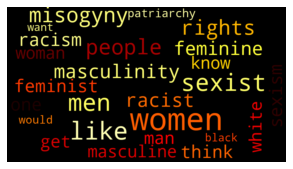

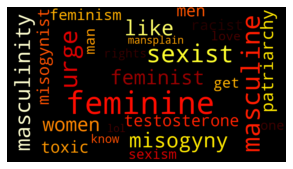

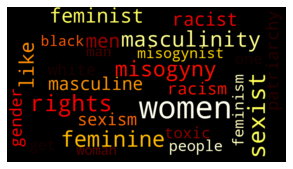

num clusters: 4


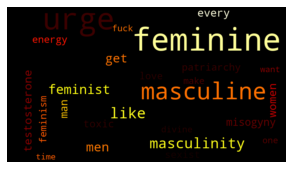

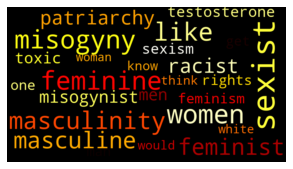

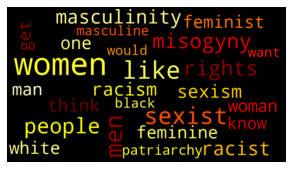

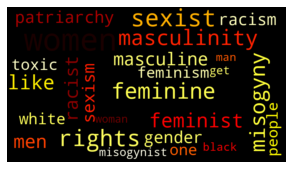

In [ ]:
# without removing the most common words
for cur_kmeans_result in kmeans_res[2:4]: # from 1 to 10, inclusive

    # removing the most common words among all clusters
    print(f"num clusters: {len(set(cur_kmeans_result.labels_))}")
    df['Bert_cluster_kmeans'] = cur_kmeans_result.labels_
# removing the most common words among all clusters

cluster_word_cloud = []
word_freqs = []
most_freq_30_words = []
for cluster in range(df.Bert_cluster_kmeans.nunique()):
    all_words = []
    for line in df[df.Bert_cluster_kmeans==cluster]['tokens']: # try 'tokens'
        all_words.extend(line)
    wordfreq = Counter(all_words)
    word_freqs.append(wordfreq)
    most_freq_30_words.extend([pair[0] for pair in wordfreq.most_common(30)])
# for cluster in range(df.Bert_cluster_kmeans_trial.nunique()):
    
wordcloud = WordCloud(width=900,
                height=500,
                max_words=25,
                max_font_size=100,
                relative_scaling=0.5,
                colormap='hot',
                normalize_plurals=True).generate_from_frequencies(wordfreq)

cluster_word_cloud.append(wordcloud)
plt.figure(figsize=(5,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


In [ ]:
Counter(kmeans_res[2].labels_)

Counter({0: 77406, 1: 44706, 2: 60202})

In [ ]:
Counter(kmeans_res[3].labels_)

Counter({0: 14762, 1: 40106, 2: 69226, 3: 58220})

In [ ]:
import pickle
# save kmeans_res, so we have labels for all k's
# pickle.dump(kmeans_res, open(f"drive/My Drive/JHU2022SPRING/data_mining/kmeans_res_Apr22.pkl","wb"))
kmeans_res = pickle.load(open(f"drive/My Drive/JHU2022SPRING/data_mining/kmeans_res_Apr22.pkl","rb"))

In [ ]:
kmeans_3=kmeans_res[2].labels_

In [ ]:
# pickle.dump(kmeans_3, open(f"drive/My Drive/JHU2022SPRING/data_mining/kmeans_ncluster=3.pkl","wb"))
kmeans_3 = pickle.load(open(f"drive/My Drive/JHU2022SPRING/data_mining/kmeans_ncluster=3.pkl","rb"))
id_states = pd.read_pickle("drive/My Drive/JHU2022SPRING/data_mining/Apr24_id_states_columns.pkl")
df['Bert_cluster_kmeans'] = kmeans_3

NameError: ignored

In [ ]:
df['Bert_cluster_kmeans']

0         0
1         2
2         0
3         1
4         1
         ..
182513    1
182514    1
182515    1
182516    2
182517    1
Name: Bert_cluster_kmeans, Length: 182314, dtype: int32

In [ ]:
df.columns

Index(['author_id', 'id', 'retweet_count', 'reply_count', 'like_count',
       'quote_count', 'text', 'source', 'referenced_tweets', 'created_at',
       'lang', 'place_id', 'cleaned text', 'tokens', 'place_name',
       'user_created_at', 'user_description', 'user_entities', 'user_id',
       'user_location', 'user_name', 'user_pinned_tweet_id',
       'user_profile_image_url', 'user_protected', 'user_followers_count',
       'user_following_count', 'user_tweet_count', 'user_listed_count',
       'user_url', 'user_username', 'user_verified', 'user_withheld', 'gender',
       'age', 'org', 'Bert_embedding', 'Bert_cluster_kmeans'],
      dtype='object')

In [ ]:
for i in range(df.Bert_cluster_kmeans.nunique()):
    print(f"cluster{i+1}:")
    df[df.Bert_cluster_kmeans==i][st]

0         3b77caf94bfc81fe
1         01fbdc902515ef96
2         e8ad2641c1cb666c
3         4548df3d99bb4891
4         016727834eac6588
                ...       
182513    09ea48200ef6f5af
182514    01a11db77ef99e2a
182515    4548df3d99bb4891
182516    01a9a39529b27f36
182517    d36f171e278ac981
Name: place_id, Length: 182314, dtype: object

In [ ]:
df.shape

(182314, 37)

In [ ]:
for i in range(df.Bert_cluster_kmeans.nunique()):
    print(f"cluster{i+1}:")
    print(df[df.Bert_cluster_kmeans==i].shape)
    print(df[df.Bert_cluster_kmeans==i].shape[0]/df.shape[0])

cluster1:
(77406, 37)
0.4245751834746646
cluster2:
(44706, 37)
0.24521430060225766
cluster3:
(60202, 37)
0.33021051592307776


In [ ]:
(~df_res.id.isin(id_states.id.values)).sum()

3

In [ ]:
id_states.columns

Index(['id', 'matched_state', 'matched_state_abbrev'], dtype='object')

In [ ]:
df_res = df.merge(id_states, how='left',on='id')
df_res[df_res.matched_state.isna()]['matched_state']
df_res.at[85474,'matched_state']='California'
df_res.at[96389,'matched_state']='California'
df_res.at[114498,'matched_state']='California'

pickle.dump(df_res, open(f"drive/My Drive/JHU2022SPRING/data_mining/df_all_ncluster_3_states.pkl","wb"))
df_res.to_pickle(open('da'))

In [ ]:
df_res.head(1).matched_state

0    California
Name: matched_state, dtype: object

In [ ]:
df_res[df_res.matched_state.isna()].matched_state='California'

In [ ]:
df_res['matched_state'] = 

In [ ]:
df_res[df_res.matched_state.isna()]['matched_state']
df_res.at[85474,'matched_state']='California'
df_res.at[96389,'matched_state']='California'
df_res.at[114498,'matched_state']='California'


In [ ]:
df_res.iloc[85474]['matched_state']

'California'

In [ ]:
# pickle.dump(df,open(f"drive/My Drive/JHU2022SPRING/data_mining/gender_full_dataset_with_m3_bert_Apr24_3clusters.pkl","wb"))
import pickle5
df = pickle.load(open(f"drive/My Drive/JHU2022SPRING/data_mining/gender_full_dataset_with_m3_bert_Apr24_3clusters.pkl","rb"))

In [ ]:
!pip install pickle5

     |████████████████████████████████| 256 kB 33.6 MB/s 


In [ ]:
import pickle5

df_george= pickle5.load(open(f"drive/My Drive/JHU2022SPRING/data_mining/twitter_4_24_9_noBERT.pkl","rb"))

In [ ]:
df_george.label_AA5.nunique()

5

In [ ]:
df[df.label_AA5==cluster]['tokens']

6         ['would', 'love', 'forced', 'real', 'hair', 'c...
28        ['feminine', 'urge', 'tell', 'every', 'little'...
33        ['makes', 'sense', 'say', 'bottom', 'attaching...
40        ['interesting', 'literal', 'know', 'word', 'do...
42        ['sorry', 'looking', 'something', 'else', 'fou...
                                ...                        
182479    ['dad', 'gives', 'brother', 'shots', '1800', '...
182482    ['great', 'time', 'playing', 'animal', 'crossi...
182487    ['added', 'couple', 'last', 'two', 'days', 'be...
182490    ['also', 'coughed', 'said', 'worry', 'allergie...
182493    ['homophobia', 'certain', 'shit', 'man', 'appa...
Name: tokens, Length: 31415, dtype: object

In [ ]:

def convert(line):
    return [word[2:-1] for word in (line[1:-1]).split(",")]

In [ ]:
all_words = []
for line in df[df.label_AA5==cluster]['tokens']: # try 'tokens'
    line = convert(line)
    all_words.extend(line)
all_words

['ould',
 'love',
 'forced',
 'real',
 'hair',
 'cut',
 'unmistakably',
 'feminine',
 'bob',
 'bangs',
 'eyebrows',
 'plucked',
 'wear',
 'makeup',
 'girls',
 'clothes',
 'everyday',
 'eminine',
 'urge',
 'tell',
 'every',
 'little',
 'detail',
 'day',
 'also',
 'try',
 'bother',
 'akes',
 'sense',
 'say',
 'bottom',
 'attaching',
 'word',
 'verse',
 'title',
 'attract',
 'guys',
 'seem',
 'masculine',
 'nteresting',
 'literal',
 'know',
 'word',
 'doll',
 'inherently',
 'feminine',
 'like',
 'jingle',
 'way',
 'turbo',
 'man',
 'toy',
 'called',
 'doll',
 'thought',
 'might',
 'bigger',
 'scale',
 'know',
 'official',
 'toymaker',
 'difference',
 'orry',
 'looking',
 'something',
 'else',
 'found',
 'nobody',
 'saying',
 'gay',
 'guys',
 'masc',
 'lesbians',
 'super',
 'feminine',
 'like',
 'come',
 'get',
 'idea',
 'already',
 'super',
 'normalized',
 'genuinely',
 'confused',
 'ade',
 'think',
 'way',
 'attractive',
 'perfect',
 'body',
 'masculinity',
 'much',
 'changed',
 'since',

['women', 'men', 'sexist', 'misogyny', 'like', 'masculinity', 'patriarchy', 'feminist', 'one', 'man', 'feminine', 'get', 'masculine', 'time']


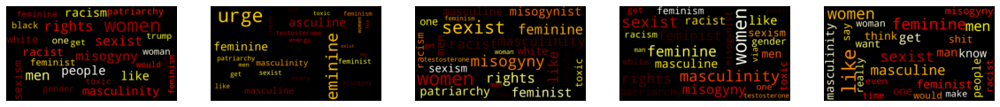

In [ ]:
df = df_george
# df['Bert_cluster_kmeans_trial'] = df_george.label_AA5
cluster_word_cloud = []
word_freqs = []
most_freq_30_words = []
for cluster in range(df.label_AA5.nunique()):
    all_words = []
    for line in df[df.label_AA5==cluster]['tokens']: # try 'tokens'
        line = convert(line)
        all_words.extend(line)
    wordfreq = Counter(all_words)
    word_freqs.append(wordfreq)
    most_freq_30_words.extend([pair[0] for pair in wordfreq.most_common(40)])

# # remove words that are very common in all 4 clusters
most_freq_counter = Counter(most_freq_30_words)
remove_words = []
remove_words = [word for word in most_freq_counter if most_freq_counter[word]>=5]

print(remove_words)
fig, axes = plt.subplots(1, 5, figsize=(20,4))

for i, word_freq in enumerate(word_freqs):
    # for word in remove_words:
    #     del word_freq[word]
    wordcloud = WordCloud(width=900,
                height=500,
                max_words=25,
                max_font_size=100,
                relative_scaling=0.5,
                colormap='hot',
                normalize_plurals=True).generate_from_frequencies(word_freq)

    cluster_word_cloud.append(wordcloud)
    # axes[i].figure(figsize=(5,4))# plt.figure(figsize=(5,4))
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis("off")